<a href="https://colab.research.google.com/github/Matsumo-chi/Grape-Grain-Detection-Dataset/blob/main/Detectron2GrapesCount.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# 上記のpytorchのバージョンに合ったdetectron2をインストールします。
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# 指定されたtorch + CUDAバージョンにマッチするdetectron2のリリースがまだない場合は、別のpytorchをインストールする必要があります。

exit(0)  # インストール後、Colabで "restart runtime "が必要になることがあります。この行でもランタイムを再起動できます

     |████████████████████████████████| 274 kB 4.0 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=832486cc79a6bf75e884b996bcde4157fe2cb4c34e3ab752cc3bfd69f4d56664
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 4.4 MB/s 
     |████████████████████████████████| 130 kB 4.3 MB/s 
     |████████████████████████████████| 145 kB 36.8 MB/s 
     |████████████████████████████████| 49 kB 7.6 MB/s 
     |████████████████████████████████| 74 kB 4.3 MB/s 
     |████████████████████████████████| 843 kB 56.2 MB/s 
     |████████████████████████████████

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset

このセクションでは、既存のdetectron2モデルを、新しいフォーマットのカスタムデータセットで学習する方法を紹介します。

ここでは、[バルーンセグメンテーションデータセット](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon)を使用します。
を使います。
ここでは、detectron2のmodel zooにあるCOCOデータセットで事前に学習された既存のモデルから、バルーンセグメンテーションモデルを学習します。

COCOデータセットには "balloon "というカテゴリがないことに注意してください。この新しいクラスを数分で認識できるようにします。

## データセットの準備

detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html)に従って、detectron2にバルーンデータセットを登録します。
ここでは、データセットが独自の形式であるため、それを解析してdetectron2の標準形式に整える関数を書いています。カスタムフォーマットのデータセットを使うときは、このような関数を書く必要があります。詳しくは、チュートリアルをご覧ください。


In [ ]:
# download, decompress the data
!wget https://github.com/Matsumo-chi/BerryCounting/blob/main/images.zip?raw=true -q -O images.zip
!unzip images.zip > /dev/null

In [ ]:
# データセットがCOCOフォーマットの場合、このセルは以下の3行で置き換えることができます。
from detectron2.data.datasets import register_coco_instances
register_coco_instances("grapes_dataset_train", {}, "images/json_annotation_train.json", "images/train")
register_coco_instances("grapes_dataset_val", {}, "images/json_annotation_val.json", "images/val")
grapes_metadata = MetadataCatalog.get("grapes_dataset_train")
dataset_dicts = DatasetCatalog.get("grapes_dataset_train")

[12/05 08:40:56 d2.data.datasets.coco]: Loaded 45 images in COCO format from images/json_annotation_train.json


データの読み込みが正しいことを確認するために、トレーニングセットの中からランダムに選んだサンプルのアノテーションを可視化してみましょう。



In [ ]:
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=grapes_metadata, scale=1.0)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Train!

それでは、COCOでトレーニングしたR50-FPN Mask R-CNNモデルを風船データセットで微調整してみましょう。P100 GPUで300イテレーションのトレーニングを行うのに約2分かかります。


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("grapes_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # モデルzooからトレーニングを初期化させる
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0002  # 厳選されたLR　0.00025
cfg.SOLVER.MAX_ITER = 1500    # このおもちゃのデータセットでは300回の反復で十分だと思いますが、実用的なデータセットではもっと長い時間訓練する必要があります。
cfg.SOLVER.STEPS = []        # do not decay 学習率
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # の方が高速で、このトイデータセットには十分な性能を持っています（デフォルト：512）
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# 注：この設定はクラスの数を意味しますが、いくつかの人気のある非公式チュートリアルでは、num_classes+1をここで使用しています。

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## 学習済みモデルによる推論と評価
それでは、バルーン検証データセットを使って、学習したモデルを使った推論を行ってみましょう。まず、先ほど学習したモデルを使ってプレディクタを作成しましょう。



In [ ]:
# 推論はトレーニングで使用されるパラメータを持つコンフィグを使用すべきである
# cfgにはこれまでに設定した内容がすべて含まれています。推論のために少しだけ変更しました。
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # 先ほど学習したモデルへのパス
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # カスタムテスト閾値の設定
predictor = DefaultPredictor(cfg)

予測結果を視覚化します。

[12/05 08:49:28 d2.data.datasets.coco]: Loaded 12 images in COCO format from images/json_annotation_val.json
images/val/image_005.jpg


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


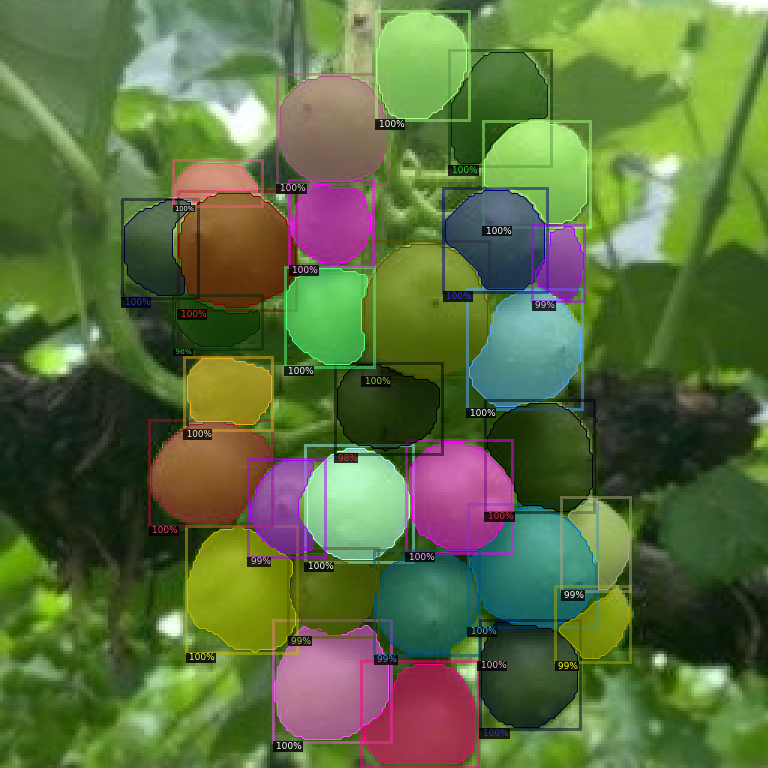

images/val/image_225.jpg


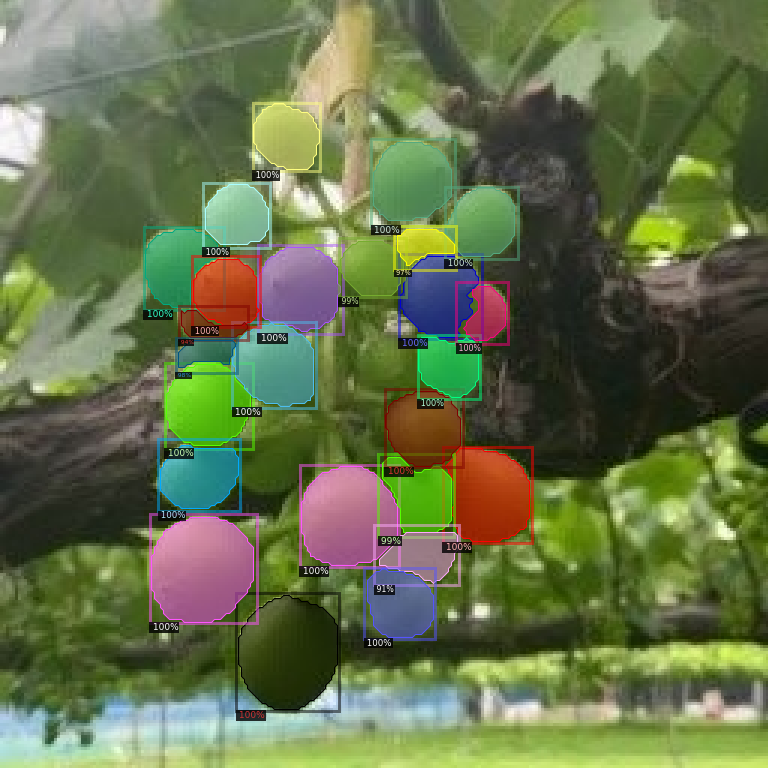

images/val/image_427.jpg


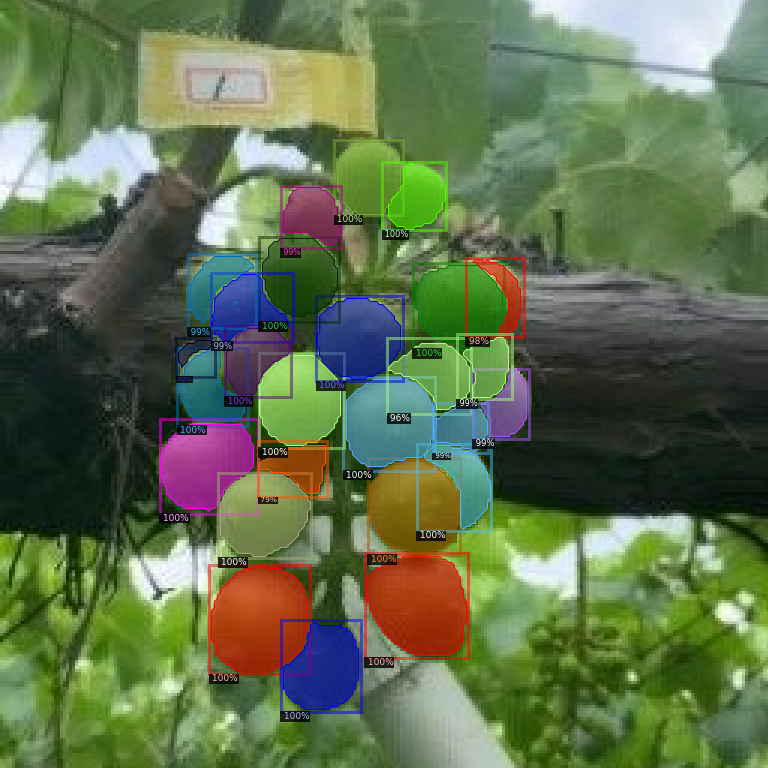

images/val/image_790.jpg


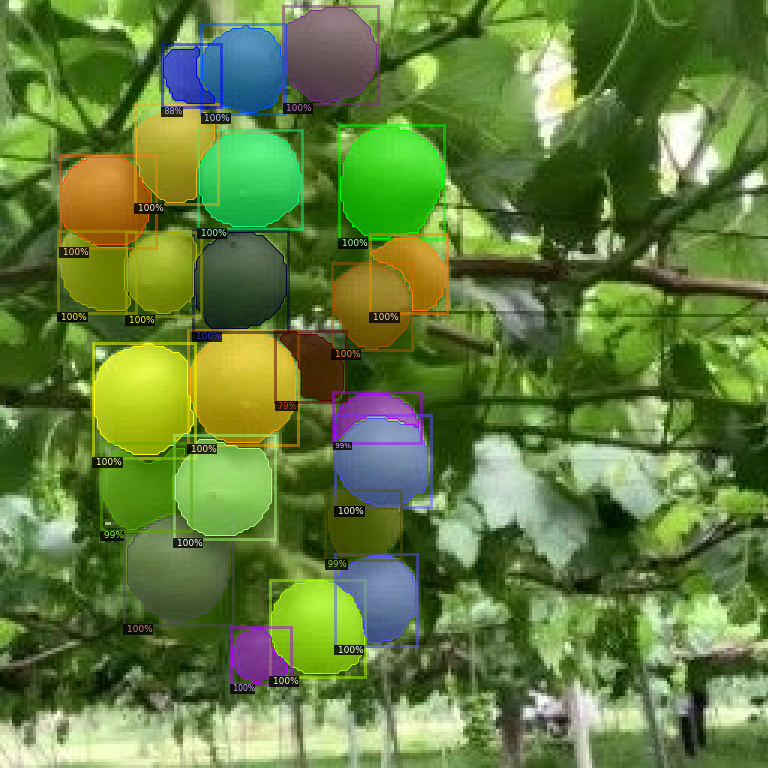

images/val/image_891.jpg


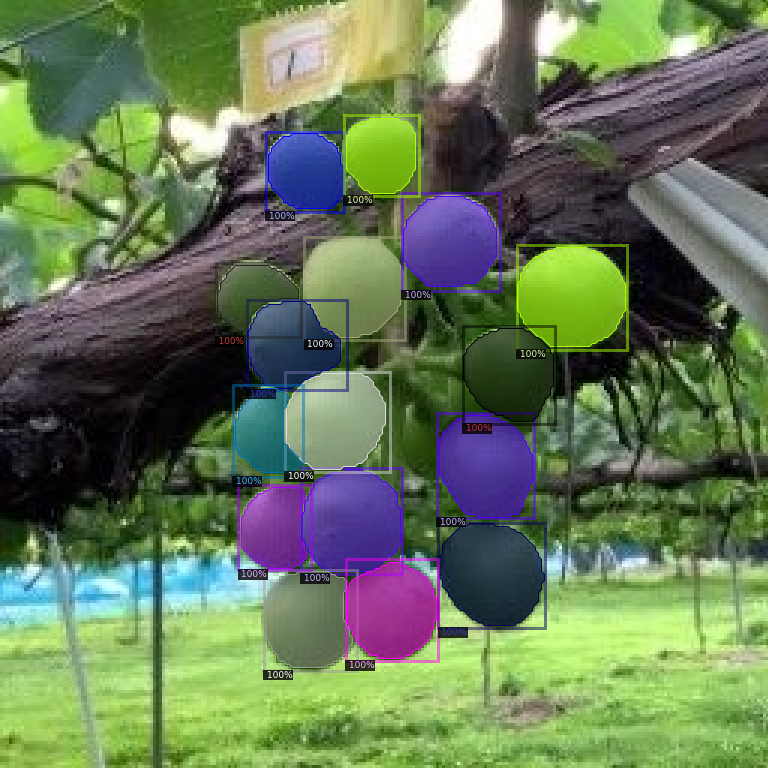

images/val/image_185.jpg


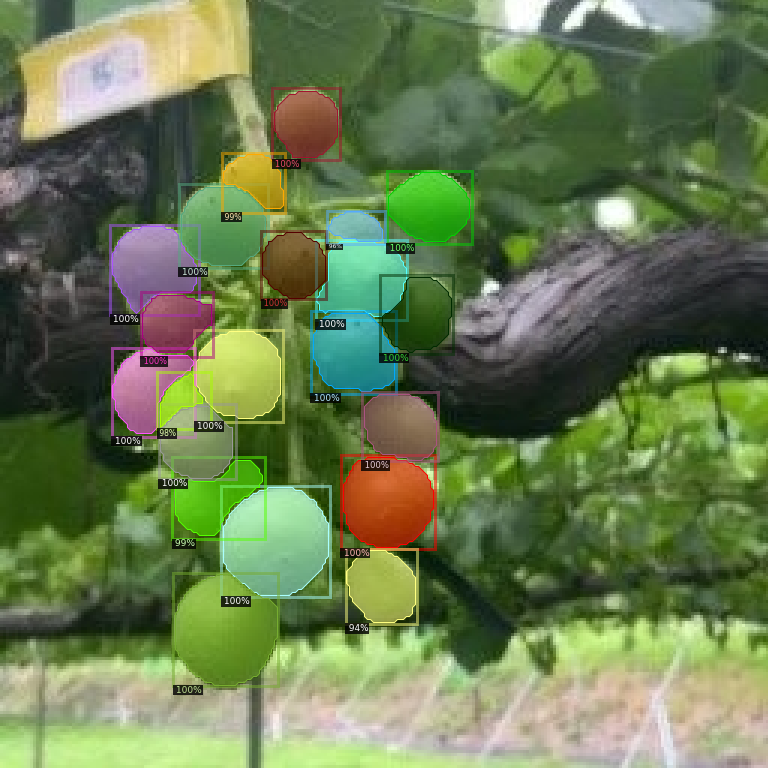

images/val/image_328.jpg


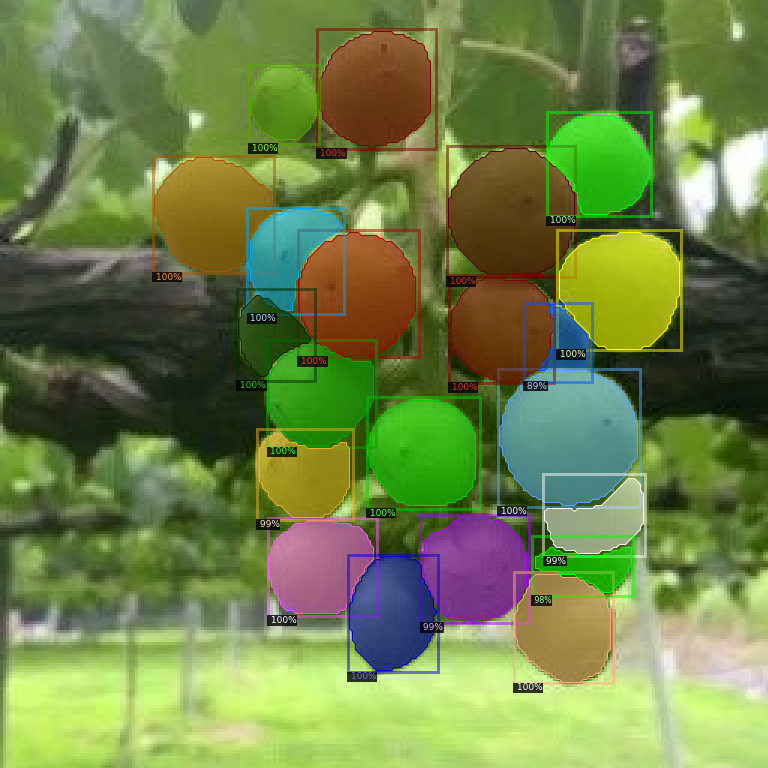

images/val/image_563.jpg


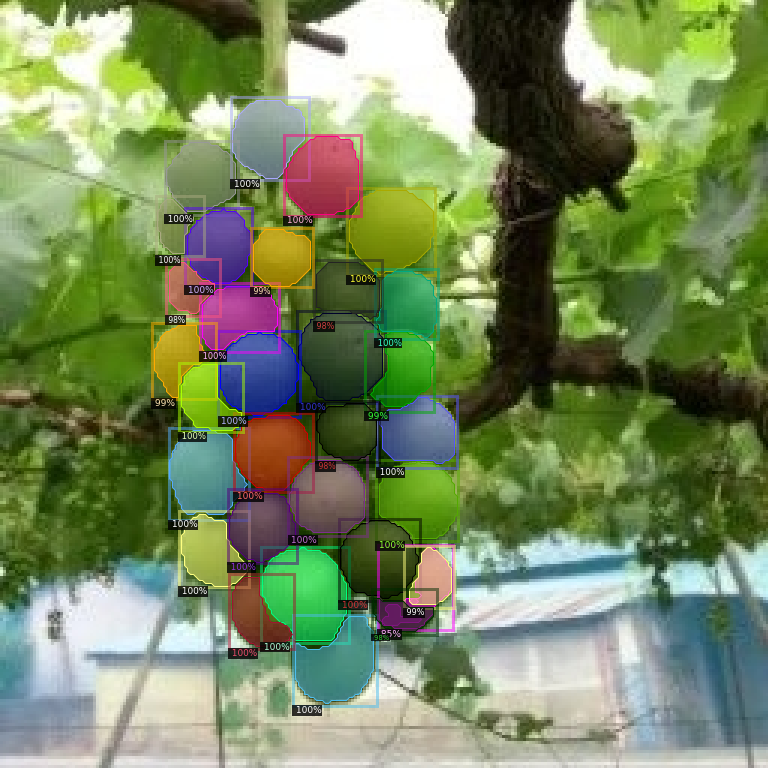

images/val/image_610.jpg


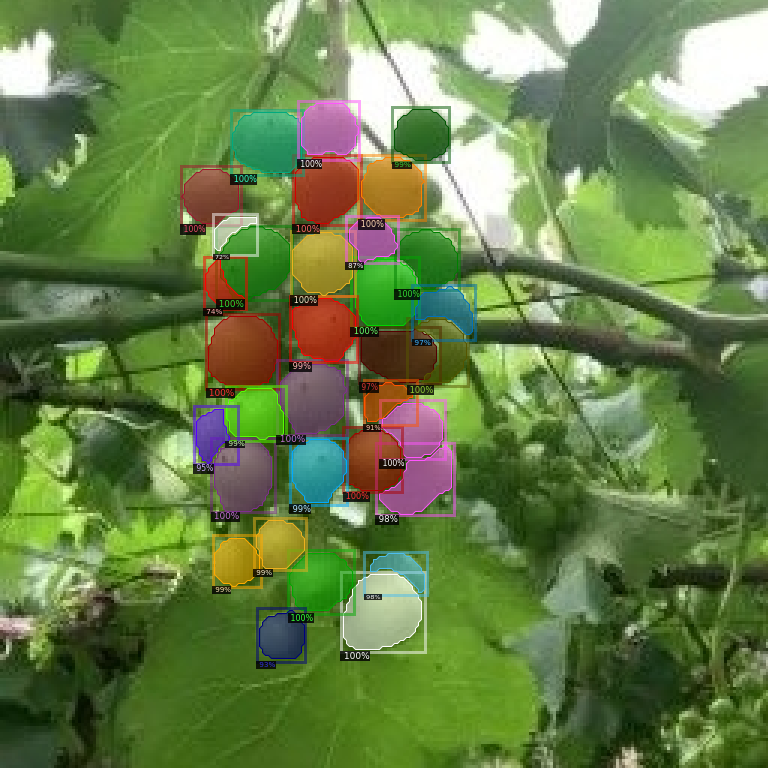

images/val/image_643.jpg


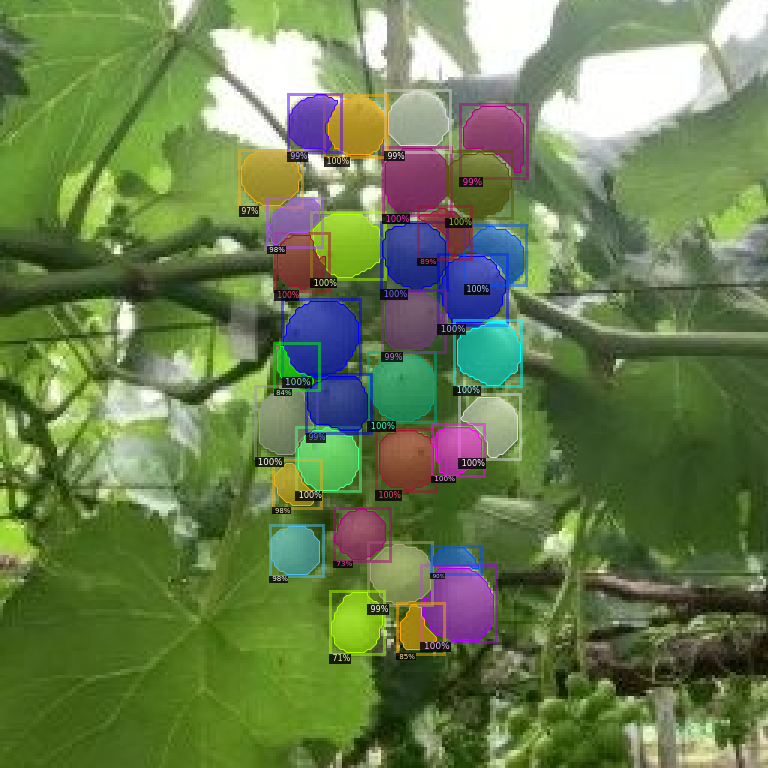

images/val/image_686.jpg


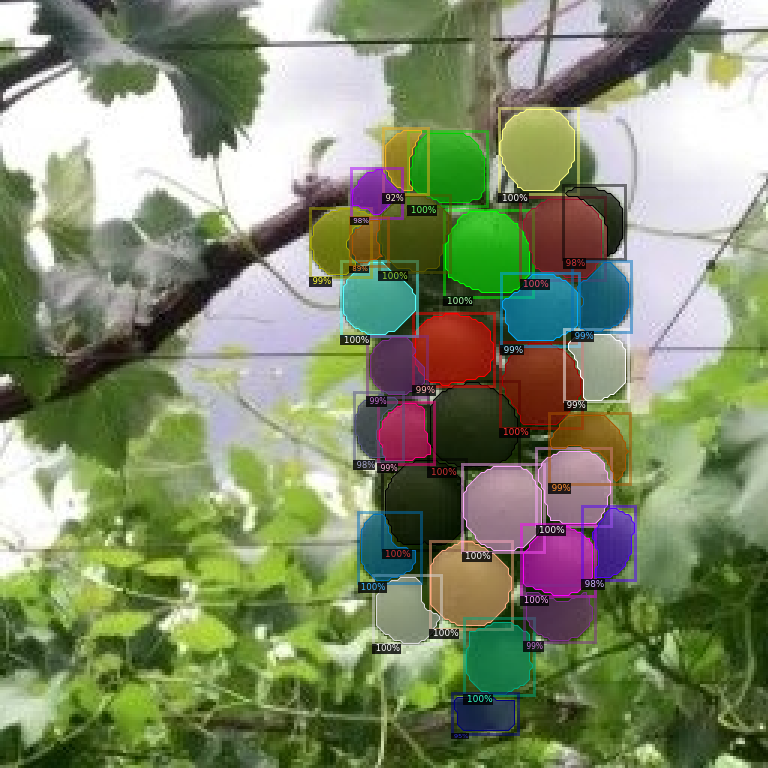

images/val/image_1035.jpg


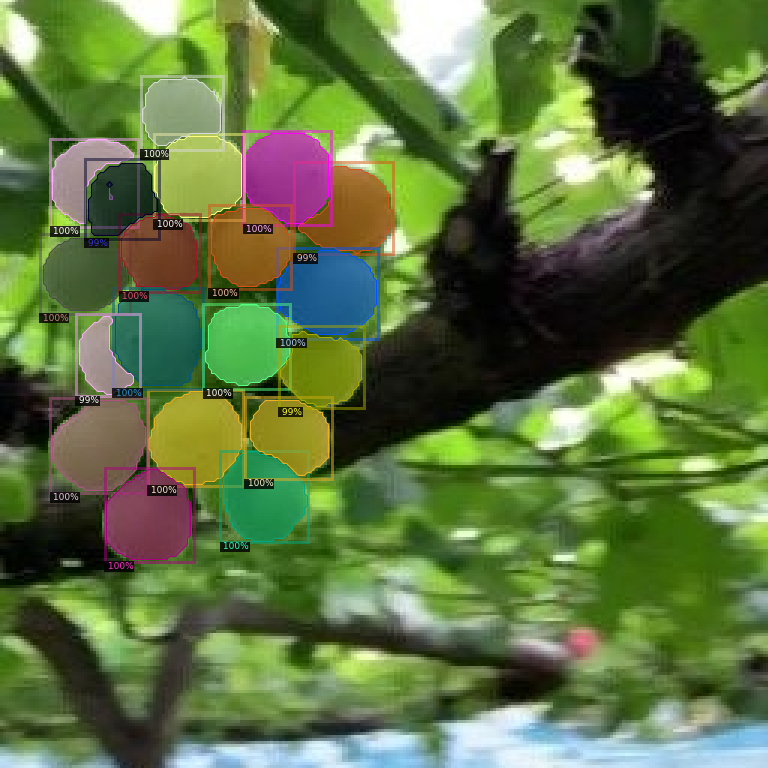

In [ ]:
from detectron2.utils.visualizer import ColorMode
grapes_metadata = MetadataCatalog.get("grapes_dataset_val")
dataset_dicts = DatasetCatalog.get("grapes_dataset_val")

#for d in random.sample(dataset_dicts, 12):    
for d in dataset_dicts: 
    im = cv2.imread(d["file_name"])
    print(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=grapes_metadata, 
                   scale=3, 
                   #instance_mode=ColorMode.IMAGE_BW   # は、セグメント化されていないピクセルの色を取り除きます。このオプションは、セグメンテーションモデルでのみ利用可能です。
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

また、COCO APIに実装されているAPメトリックを使って、その性能を評価することもできます。
これにより、APは約70となりました。悪くないですね。

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("grapes_dataset_val", output_dir="/output")
val_loader = build_detection_test_loader(cfg, "grapes_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[12/05 08:49:31 d2.data.datasets.coco]: Loaded 12 images in COCO format from images/json_annotation_val.json
[12/05 08:49:31 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|            | 330          |
|            |              |
[12/05 08:49:31 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/05 08:49:31 d2.data.common]: Serializing 12 elements to byte tensors and concatenating them all ...
[12/05 08:49:31 d2.data.common]: Serialized dataset takes 0.05 MiB
[12/05 08:49:31 d2.evaluation.evaluator]: Start inference on 12 batches


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[12/05 08:49:32 d2.evaluation.evaluator]: Inference done 11/12. Dataloading: 0.0009 s/iter. Inference: 0.0545 s/iter. Eval: 0.0054 s/iter. Total: 0.0608 s/iter. ETA=0:00:00
[12/05 08:49:33 d2.evaluation.evaluator]: Total inference time: 0:00:00.483162 (0.069023 s / iter per device, on 1 devices)
[12/05 08:49:33 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.054407 s / iter per device, on 1 devices)
[12/05 08:49:33 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/05 08:49:33 d2.evaluation.coco_evaluation]: Saving results to /output/coco_instances_results.json
[12/05 08:49:33 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/05 08:49:33 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/05 08:49:33 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[12/05 08:49:33 d2.evaluation.f